# Vehicle Detection

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

In [596]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline
from skimage.feature import hog

import time
from sklearn import svm
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid 
# for scikit-learn version <= 0.17
# if you are using scikit-learn >= 0.18 then use this:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import pickle
import random 



In [597]:
# Load data set and see how many examples
car_images = glob.glob('training_imgs/vehicles/**/*.png')
noncar_images = glob.glob('training_imgs/non-vehicles/**/*.png')
print("number of car images=",len(car_images),"number of non-car images=",len(noncar_images))

number of car images= 8792 number of non-car images= 8968


## Feature Extraction

1) Use the spatial features downsampled.

2) Use the histogram of color space.

3) Use the histogram of oriented gradients.

In [576]:
def bin_spatial(img,size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    c0 = cv2.resize(img[:,:,0],size).ravel()
    c1 = cv2.resize(img[:,:,1],size).ravel()
    c2 = cv2.resize(img[:,:,2],size).ravel()
    spa_features = np.hstack((c0,c1,c2))
    
    # Return the feature vector
    return spa_features

def color_hist(img, nbins=32): # bins_range=(0, 256) bad for png
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, 
                     feature_vec=True):
                         
    if vis==True:
        
        fvec,hog_img = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell,pix_per_cell),
                    cells_per_block=(cell_per_block,cell_per_block), block_norm = 'L2-Hys',transform_sqrt = False, visualise=vis,  
                    feature_vector=feature_vec)
        return fvec,hog_img

    else:
        fvec = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell,pix_per_cell),
                    cells_per_block=(cell_per_block,cell_per_block),block_norm = 'L2-Hys', transform_sqrt = False, visualise=vis,  
                    feature_vector=feature_vec)
        return fvec
    

def extract_features(imgs, cspace='RGB', spatial_size=(32,32),
                    hist_bins=32, orient=9, pix_per_cell=8, 
                    cell_per_block=2, hog_channel=0,
                    spa_feat=True,color_hist_feat=True,hog_feat=True,vis=False):
    
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
            # Read in each one by one
            image = mpimg.imread(file)
            file_features = []
            # apply color conversion if other than 'RGB'
            if cspace != 'RGB':
                if cspace == 'HSV':
                    feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
                elif cspace == 'LUV':
                    feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
                elif cspace == 'HLS':
                    feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
                elif cspace == 'YUV':
                    feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
                elif cspace == 'YCrCb':
                    feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
            else: 
                feature_image = np.copy(image)   

            if spa_feat==True:
                spacial_features = bin_spatial(feature_image,size=spatial_size)
                file_features.append(spacial_features)

            if color_hist_feat == True:
                color_features = color_hist(feature_image, nbins=hist_bins)
                file_features.append(color_features)

            if hog_feat == True:
                if vis==False:
                    if hog_channel == 'ALL':
                        hog_features = []
                        for channel in range(feature_image.shape[2]):
                            hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                                orient, pix_per_cell, cell_per_block, 
                                                vis=vis, feature_vec=True))
                        hog_features = np.ravel(hog_features)        
                    else:
                        hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                    pix_per_cell, cell_per_block, vis=vis, feature_vec=True)
                    # Append the new feature vector to the features list
                    file_features.append(hog_features) 
                if vis==True:
                    if hog_channel == 'ALL':
                        hog_features = []
                        for channel in range(feature_image.shape[2]):

                            hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                                orient, pix_per_cell, cell_per_block, 
                                                vis=False, feature_vec=True))
                        hog_features = np.ravel(hog_features)        
                        hog_img = None
                    else:
                        hog_features,hog_img = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                    pix_per_cell, cell_per_block, vis=vis, feature_vec=True)

                    file_features.append(hog_features)
                    # concatenate the features
                    features.append(np.concatenate(file_features))
                    return features,hog_img
            # concatenate the features
            features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


def search_windows(img, window_list, clf, scaler, c_space='RGB',
                spatial_size=(32,32),hist_bins=32, orient=9, pix_per_cell=8, 
                    cell_per_block=2, hog_channel=0,
                    spa_feat=True,color_hist_feat=True,hog_feat=True):

    # List to store recognized windows from classifier
    hot_windows=[]
    training_image_size = (64,64)
    for window in window_list:
        # Extract sub region of image that is same size as training image
        image_to_classify = cv2.resize(img[window[0][1]:window[1][1],window[0][0]:window[1][0]],training_image_size)

        # Extract features from the image
        features = single_img_features(image_to_classify, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat,vis=False)

        
        # Scale the features (normalize) for the classifier
        features = scaler.transform(np.array(features).reshape(1,-1))

        # Predict using classifier
        predicted = clf.predict(features)
        if predicted == 1:
            hot_windows.append(window)

    return hot_windows

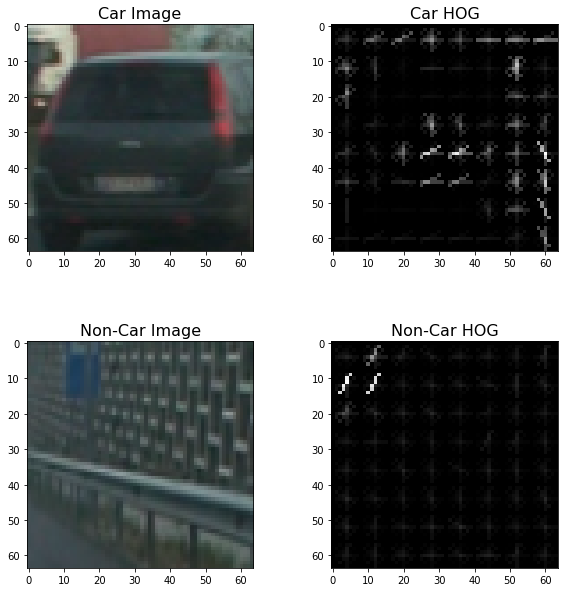

In [604]:
car_ind = np.random.randint(0,len(car_images))
non_car_ind = np.random.randint(0,len(noncar_images))

# scipy.misc.imread represent jpg and png the same
# Read car and non-car images
car_img_string = [car_images[car_ind]]
non_car_string = [noncar_images[non_car_ind]]

# Define the parameters for processing the image
c_space='RGB'
orient = 6
spatial_size = (16,16)
hist_bins = 16  
pix_per_cell = 8
cell_per_block = 2 
hog_channel = 0
spa_feat = True
color_hist_feat = True
hog_feat = True

c_features,c_hog_img = extract_features(car_img_string, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat,vis=True)

nonc_features,nonc_hog_img = extract_features(non_car_string, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat,vis=True)

# c_features = np.array(c_features)
# print(type(c_features[0][0]))
# Create an array stack of feature vectors
# X = np.vstack((c_features,nonc_features)).astype(np.float64)
# Plot
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10,10))
f.subplots_adjust(hspace = .4, wspace=.2)
ax1.imshow(car_img)
ax1.set_title('Car Image', fontsize=16)
ax2.imshow(c_hog_img,cmap='gray')
ax2.set_title('Car HOG', fontsize=16)
ax3.imshow(non_car_img)
ax3.set_title('Non-Car Image', fontsize=16)
ax4.imshow(nonc_hog_img,cmap='gray')
ax4.set_title('Non-Car HOG', fontsize=16)
f.savefig("output_images/Hog_image.jpg")

## Train the Linear SVM:

In [605]:
c_space= 'YUV' # others RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
spatial_size = (32,32)
hist_bins = 32  
pix_per_cell = 8
cell_per_block = 4
hog_channel = 0
spa_feat = True
color_hist_feat = True
hog_feat = True
t = time.time()
n = 5000
rand_inds = np.random.randint(0,len(car_images),n)
test_cars = np.array(car_images)[rand_inds]
test_noncars = np.array(noncar_images)[rand_inds]

car_features = extract_features(test_cars, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,
                                hog_feat=hog_feat,vis=False)

non_car_features = extract_features(test_noncars, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,
                                hog_feat=hog_feat,vis=False)


print("Time to compute features: ",time.time()-t)
print(len(car_features))
print(len(non_car_features))


# print(type(car_features[0][0]))
# # Create an array stack of feature vectors
X = np.vstack((car_features,non_car_features)).astype(np.float64)

# Normalize
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

# Define labels
y = np.hstack((np.ones(len(car_features)),np.zeros(len(non_car_features))))

# Split to training and testing sets
rand_state = np.random.randint(0,100)
X_train,X_test,y_train,y_test = train_test_split(scaled_X,y,test_size=0.1,
                                                 random_state=rand_state)

print("Feature Vector Length:",len(X_train[0]))

# # Use a linear SVC 
# svr = svm.SVC()
# # Check the training time for the SVC
# t=time.time()
# #Set the parameter for gridsearch
# parameters = {'C': [0.01, 0.1, 1, 10], 'kernel': ['linear']}
# clf = GridSearchCV(svr, parameters)
# clf.fit(X_train, y_train)
# best_parameter = clf.best_params_
# bestscore = clf.best_score_
# t2 = time.time()
# print(round(t2-t, 2), 'Seconds to train SVC...')
# # Check the score of the SVC
# print("best svm parameter is : %s" % best_parameter)
# print("best score is : %s" %bestscore)
# test_accuracy = round(clf.score(X_test, y_test), 4)
# print('Test Accuracy of SVC = ', test_accuracy)

# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
test_accuracy = round(svc.score(X_test, y_test), 4)
with open("feature_parms.txt", 'a') as f:
       f.write("Feature Vector Length:"+repr(len(X_train[0]))+"\ncspace="+repr(c_space)+"\nspatial_size="+repr(spatial_size)+
               "\nhist_bins="+repr(hist_bins)+"\norient="+repr(orient)+"\npix_per_cell="+repr(pix_per_cell)+
                "\ncell_per_block="+repr(cell_per_block)+"\nhog_channel="+repr(hog_channel)+
                "\nspa_feat="+repr(spa_feat)+"\ncolor_hist_feat="+repr(color_hist_feat)+
                "\nhog_feat="+repr(hog_feat)+"\ntest accuracy:"+repr(test_accuracy)+".\n\n\n")

with open("rand.txt", 'a') as f:
       f.write("rand_inds="+repr(rand_inds)+"\nrand_state="+repr(rand_state)+"\n\n\n")
# save the model to disk
filename = 'svm_model.sav'

pickle.dump(svc, open(filename, 'wb'))

Time to compute features:  31.94840407371521
5000
5000
Feature Vector Length: 6768
19.92 Seconds to train SVC...
Test Accuracy of SVC =  0.989


In [299]:
# loaded_clf = pickle.load(open('svm_model.sav', 'rb'))
# test_accuracy = round(loaded_clf.score(X_test, y_test), 4)
# print('Test Accuracy of SVC = ', test_accuracy)
# print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

Try predicting a randomly selected image.

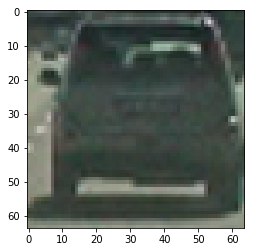

This car was predicted as [ 1.]


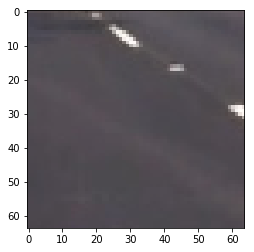

This non car was predicted as [ 0.]


In [606]:
car_ind = np.random.randint(0,len(car_images))
non_car_ind = np.random.randint(0,len(noncar_images))

# scipy.misc.imread represent jpg and png the same
# Read car and non-car images
car_img_string = [car_images[car_ind]]
non_car_string = [noncar_images[non_car_ind]]

car_img = mpimg.imread(car_images[car_ind])
noncar_img= mpimg.imread(noncar_images[non_car_ind])

c_space= 'YUV' # others RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
spatial_size = (32,32)
hist_bins = 32  
pix_per_cell = 8
cell_per_block = 4
hog_channel = 0
spa_feat = True
color_hist_feat = True
hog_feat = True

c_features = extract_features(car_img_string, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat,vis=False)

# Scale extracted features for classfier
scaled_c_features = X_scaler.transform(np.array(c_features).reshape(1,-1))

# Make a prediction
y_pred_car = svc.predict(scaled_c_features)
plt.imshow(car_img)
plt.show()
print("This car was predicted as", y_pred_car)

nonc_features = extract_features(non_car_string, cspace=c_space, spatial_size=spatial_size,
                    hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, hog_channel=hog_channel,
                    spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat,vis=False)

# Scale extracted features for classfier
scaled_nonc_features = X_scaler.transform(np.array(nonc_features).reshape(1,-1))

# Make a prediction
y_pred_noncar = svc.predict(scaled_nonc_features)
plt.imshow(noncar_img)
plt.show()
print("This non car was predicted as", y_pred_noncar)


## Implement Sliding window search

In [607]:
def plot_windows(img1,img2,title):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .4, wspace=.2)
    ax1.imshow(img1)
    ax1.set_title('original image:'+title, fontsize=16)
    ax2.imshow(img2)
    ax2.set_title('windows_drawn', fontsize=16)

0.0 1.0


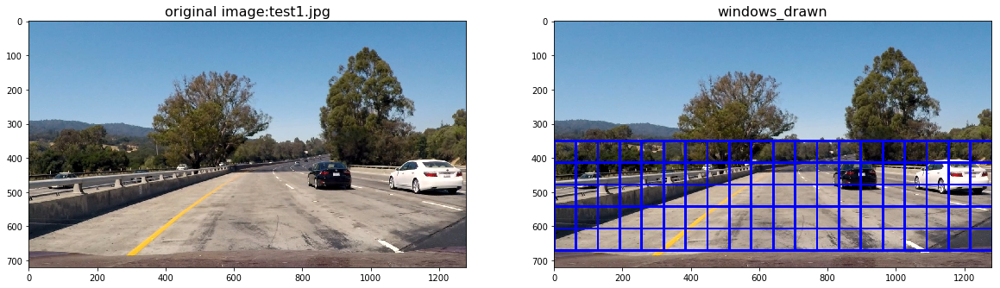

0.0 1.0


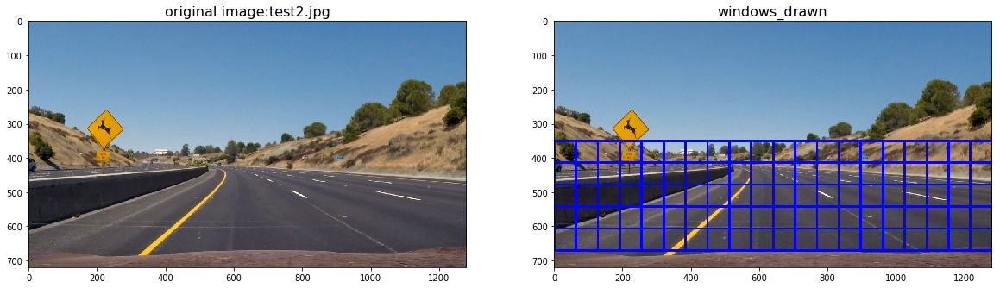

0.0 1.0


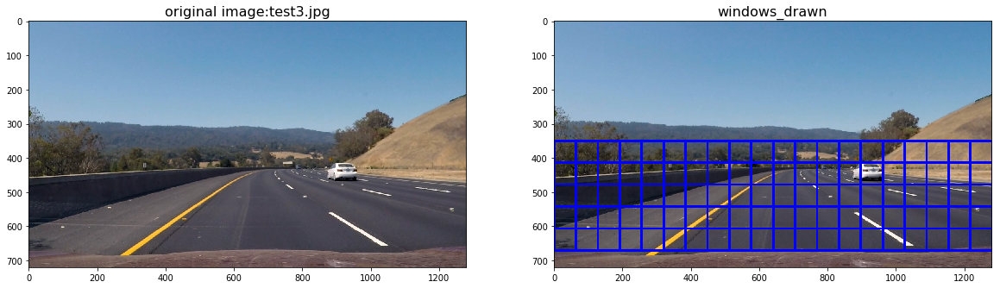

0.0 1.0


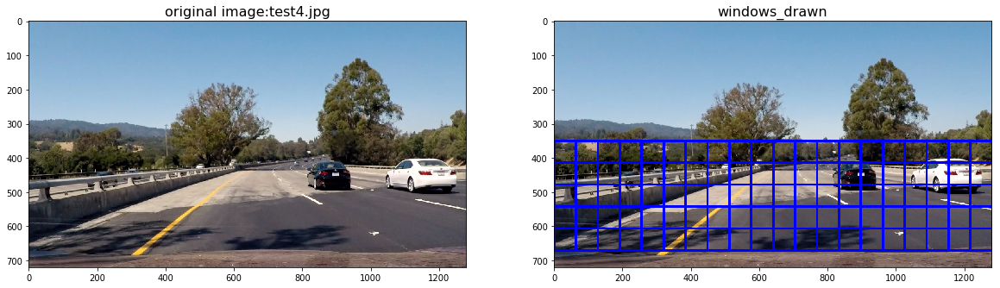

0.0 1.0


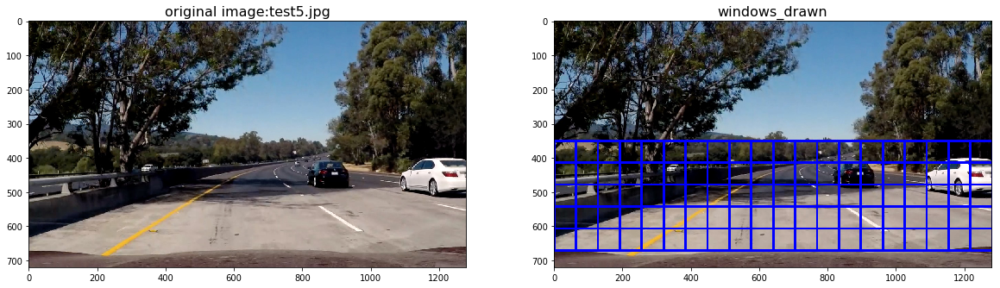

0.0 1.0


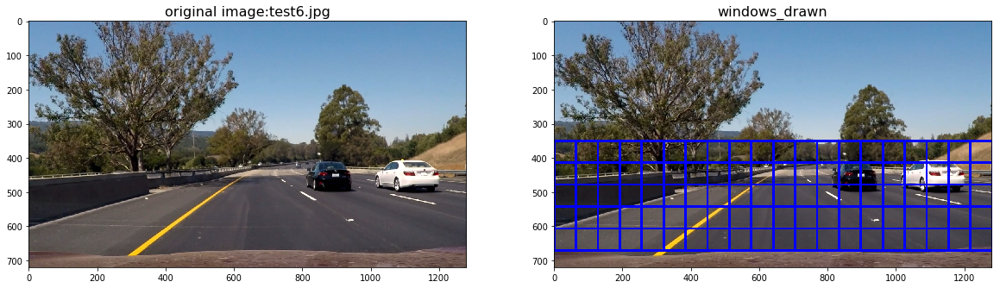

In [608]:
test_imgs = glob.glob('test_images/test*.jpg')
y_start_stop = [350,700]
overlap = 0.5
for img in test_imgs:
        title = img.split('/')
        title = title[-1]
        t=time.time()
        image = mpimg.imread(img)
        draw_img = np.copy(image)
        image = image.astype(np.float32)/255 # For jpg, scaling issues since classifier trained on png
        print(np.min(image),np.max(image))
        window_list = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(128, 128), xy_overlap=(overlap, overlap))
        
        window_img = draw_boxes(draw_img, window_list, color=(0, 0, 255), thick=6)
        plot_windows(draw_img,window_img,title)
        plt.show()
        
        
        
        

## Search for cars in the window

0.0 1.0


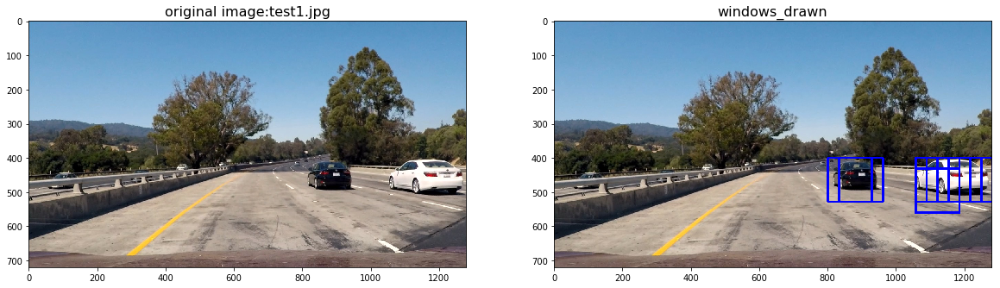

0.0 1.0


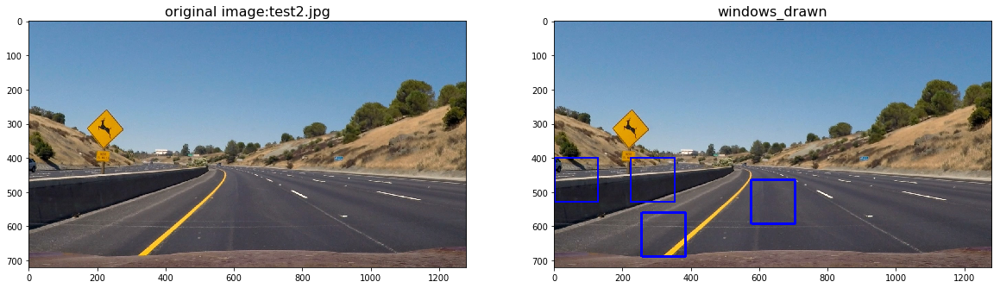

0.0 1.0


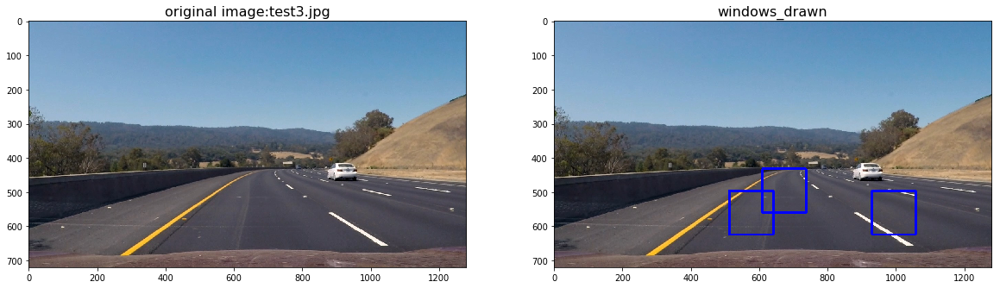

0.0 1.0


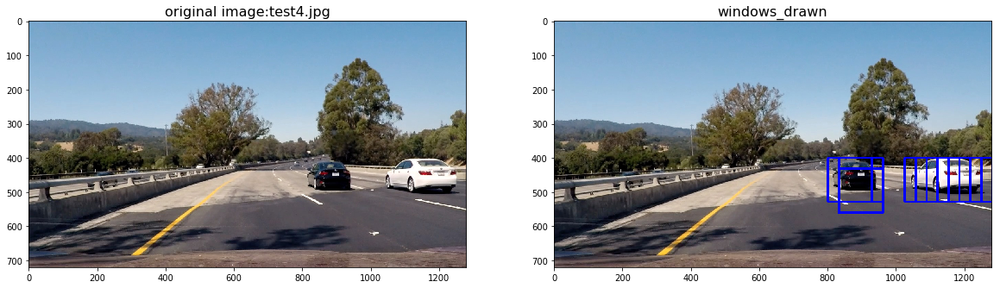

0.0 1.0


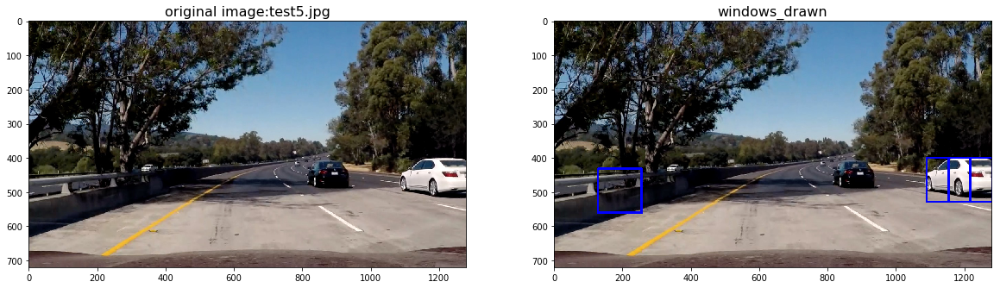

0.0 1.0


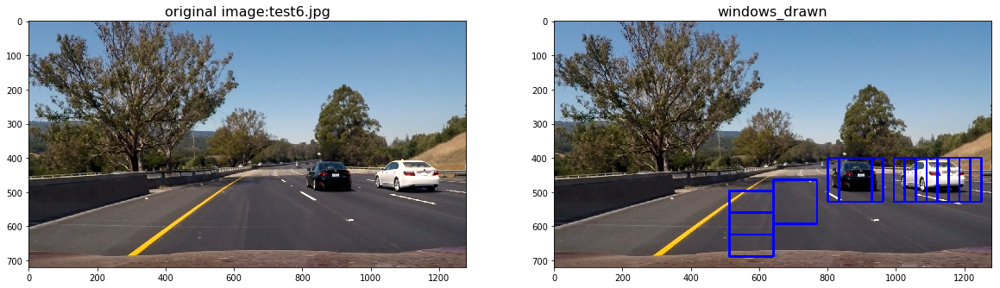

In [609]:
test_imgs = glob.glob('test_images/test*.jpg')
y_start_stop = [400,700]
overlap = 0.75
window_images = []
for img in test_imgs:
    title = img.split('/')
    title = title[-1]
    t=time.time()
    image = mpimg.imread(img)
    draw_img = np.copy(image)
    image = image.astype(np.float32)/255 # For jpg, scaling issues since classifier trained on png
    print(np.min(image),np.max(image))
    window_list = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                xy_window=(128, 128), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(image, window_list, svc, X_scaler, c_space=c_space, spatial_size=spatial_size,
                hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                cell_per_block=cell_per_block, hog_channel=hog_channel,
                spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)
    window_images.append(window_img)
    plot_windows(draw_img,window_img,title)
    plt.show()

As we can observe we have a lot of false positives but not false negatives. We can resolve this by thresholding the heat map.

## Heat map threshold

In [611]:
from scipy.ndimage.measurements import label
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (255,0,0), 6)
    # Return the image
    return img

def plot_windows_heat(img1,img2,title):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .4, wspace=.2)
    ax1.imshow(img1)
    ax1.set_title('Update car windows:'+title, fontsize=16)
    ax2.imshow(img2)
    ax2.set_title('heat map', fontsize=16)
    f.savefig("output_images/"+title+".jpg")

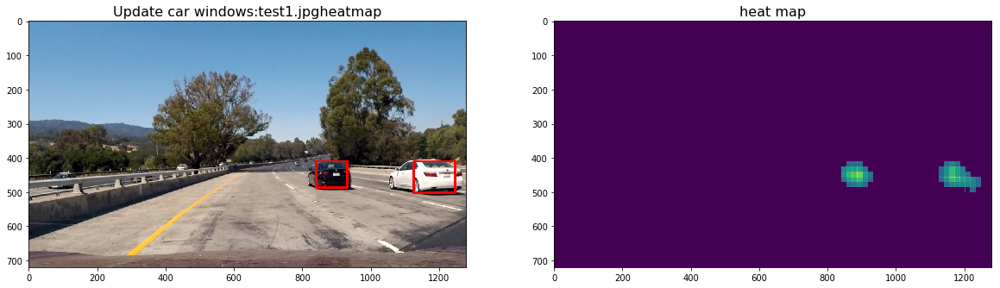

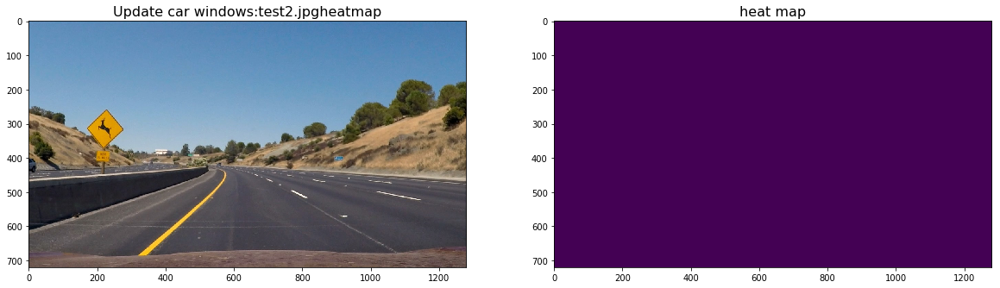

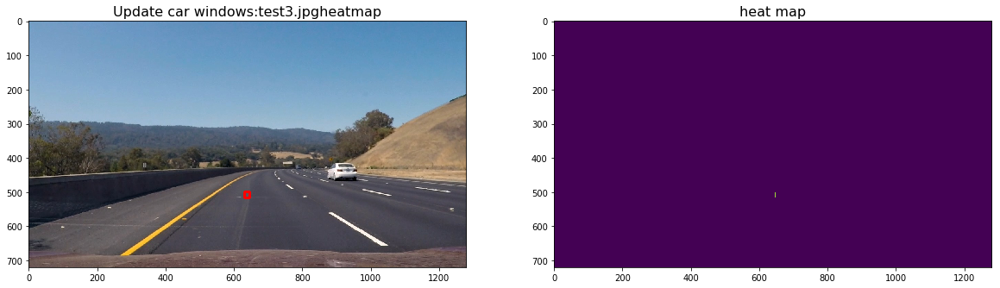

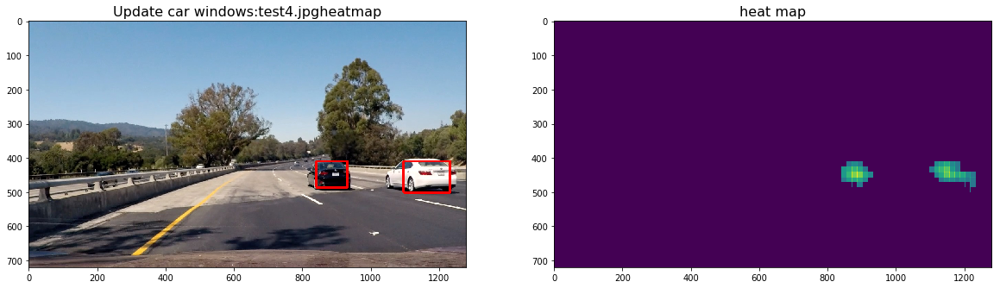

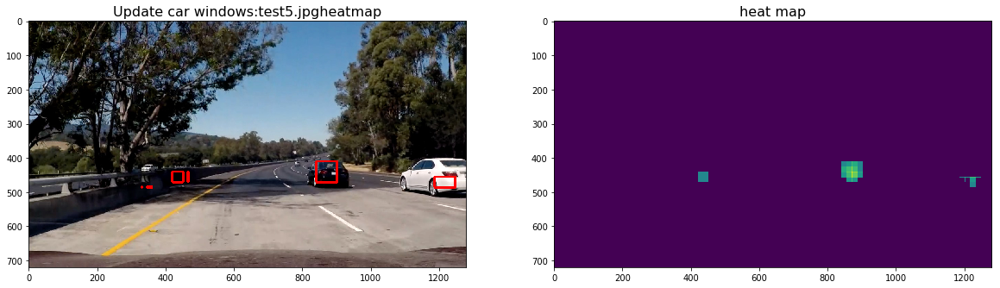

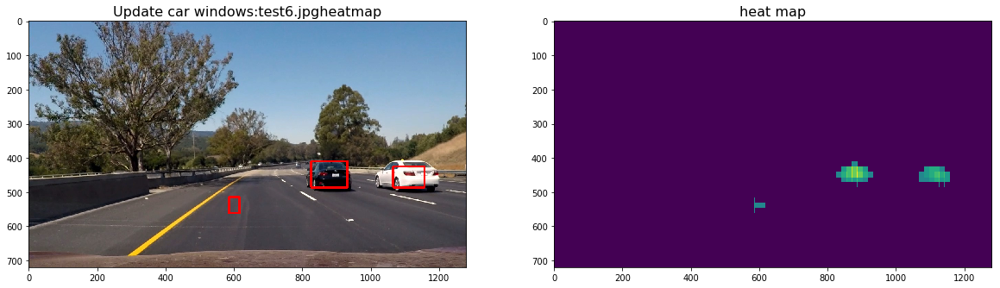

In [612]:
test_imgs = glob.glob('test_images/test*.jpg')
y_start_stop = [380,600]
overlap = 0.75
for img in test_imgs:
    title = img.split('/')
    title = title[-1]
    title=title+'heatmap'
    t=time.time()
    image = mpimg.imread(img)
    draw_img_1 = np.copy(image)
    image = image.astype(np.float32)/255 # For jpg, scaling issues since classifier trained on png
#     print(np.min(image),np.max(image))
    window_list = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                xy_window=(62, 62), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(image, window_list, svc, X_scaler, c_space=c_space, spatial_size=spatial_size,
                hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, 
                cell_per_block=cell_per_block, hog_channel=hog_channel,
                spa_feat=spa_feat,color_hist_feat=color_hist_feat,hog_feat=hog_feat)

    # labels = label(heatmap)
    window_img = draw_boxes(draw_img_1, hot_windows, color=(0, 0, 255), thick=6)
    
    # Initialize heat map
    heat_map = np.zeros_like(window_img[:,:,0])
    
    # Add heat to the boxes in hot_windows
    heat_map = add_heat(heat_map,hot_windows)
    
    # Apply threshold to remove false positives
    heat_map_thresholded = apply_threshold(heat_map,5.7)
    
    # Visualize the heatmap when displaying    
    heatmap_vis = np.clip(heat_map_thresholded, 0, 255)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap_vis)
    draw_img_f = draw_labeled_bboxes(draw_img_1, labels)
    
    plot_windows_heat(draw_img_f,heatmap_vis,title)
    plt.show()

Here we have eliminated most of the false positives.

## Variable Window sizes

In [613]:
def vary_window_size(n):
    sizes = []
    for i in range(n):
        min_size = 64
        max_size = 200
        size = int(np.round((max_size - min_size) / n)*i + min_size)
        sizes.append([size, size])
    return sizes

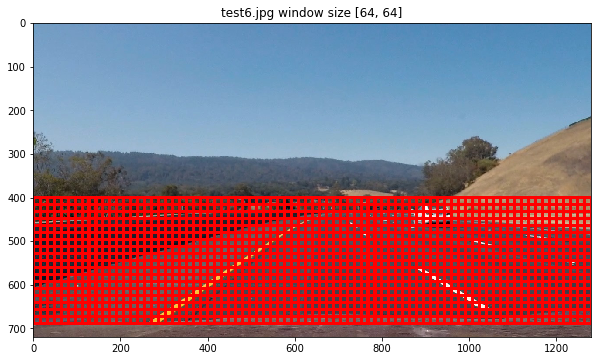

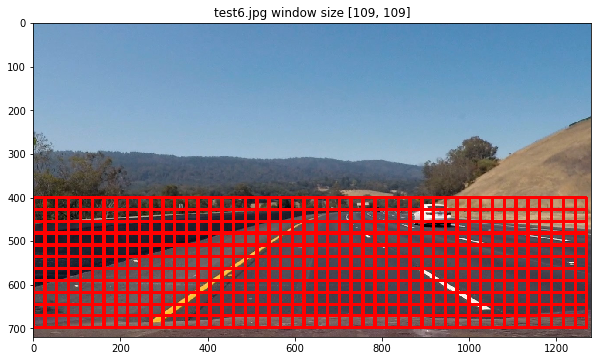

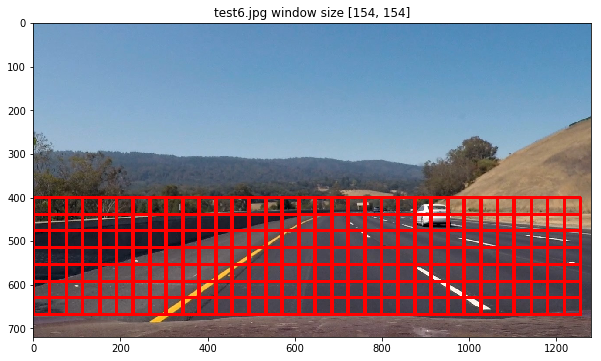

In [617]:
test_img = ('test_images/test3.jpg')
y_start_stop = [400,700]
overlap = 0.75
title = img.split('/')
title = title[-1]
image = mpimg.imread(test_img)
drawn_img = np.copy(image)
sizes = vary_window_size(3)
for size in sizes:
    drawn_img = np.copy(image)
    window_list = slide_window(drawn_img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                xy_window=size, xy_overlap=(overlap, overlap))
    window_img = draw_boxes(drawn_img, window_list, color=(255, 0, 0), thick=6) 
    fig = plt.figure(figsize=(10,10))
    plt.imshow(window_img)
    plt.title(title+" window size "+ str(size))
    fig.savefig("output_images/variable_window_size"+str(size)+".jpg")
    plt.show()
    


This will help in detecting cars at different scales. 
We have to customize the scale for each y range to minimize windows searched and processing time. The implementation of find_cars from class is a good start.

In [618]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)


In [619]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    count=0
    img_boxes = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255

    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch,conv='RGB2YUV')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 4  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1

    # Compute individual channel HOG features for the entire image
    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, vis=False,feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, vis=False,feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, vis=False,feature_vec=False)
    else: 
         hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, vis=False,feature_vec=False)

    for xb in range(nxsteps):
        for yb in range(nysteps):
            count+=1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            if hog_channel == 'ALL':
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() # ch1 selected

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            # features_scaled = []
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)) 
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return img_boxes

Customize the search window y range and scaling factors according how the cars look in the image.

By experimenting with the ranges and scales, the folllowing ranges and scales below provide good results on the test images.

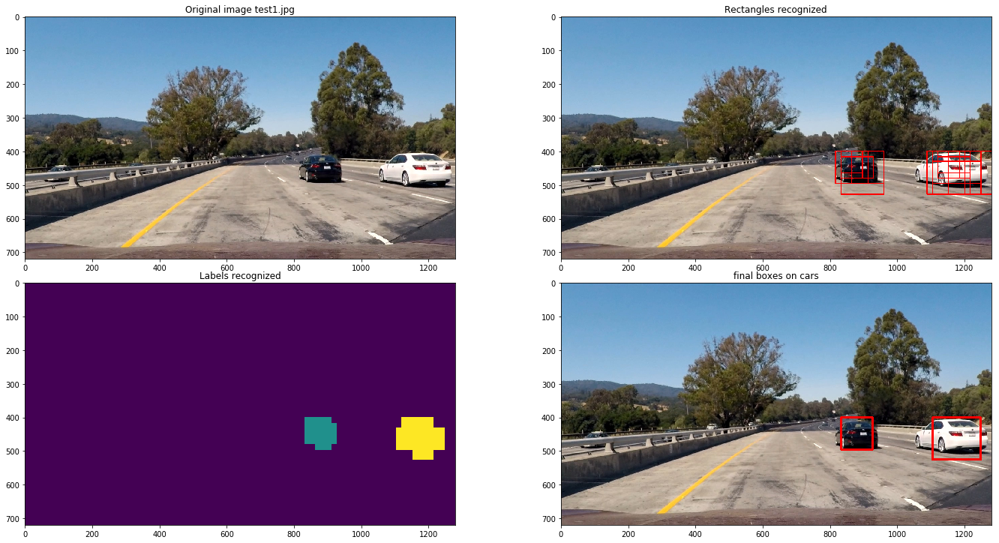

In [620]:
for img_ind in range(0,len(test_imgs)): 
    if img_ind==0:
        title = test_imgs[img_ind].split("/")
        title=title[-1]
        img = mpimg.imread(test_imgs[img_ind])
        out_img = np.copy(img)
        rectangles=[]
        ystart = 400
        ystop = 464
        scale = 1.0
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
    
        ystart = 416
        ystop = 480
        scale = 1.0
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
        
        ystart = 400
        ystop = 496
        scale = 1.5
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
        
        ystart = 430
        ystop = 530
        scale = 1.5
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
        
        ystart = 400
        ystop = 530
        scale = 2.0
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
        
        ystart = 430
        ystop = 560
        scale = 2.0
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
        ystart = 400
        ystop = 600
        scale = 3.5
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
        
        ystart = 464
        ystop = 660
        scale = 3.5
        rects = find_cars(img, ystart, ystop, scale, svc, 
                         X_scaler, orient, pix_per_cell, 
                         cell_per_block, spatial_size, hist_bins)
#         print(len(rects))
        rectangles.append(rects)
#         print(len(rectangles))
        

        # Flatten the rectangles list
        rectangles = [item for sublist in rectangles for item in sublist]
#         print(rectangles[0].shape)
        rect_img = draw_boxes(out_img, rectangles, color=(255, 0, 0), thick=2)
        heatmap = np.zeros_like(img[:,:,0])
        heatmap = add_heat(heatmap,rectangles)
        # Apply threshold
        heat_map_thresholded = apply_threshold(heatmap,2)
        # Visualize the heatmap when displaying    
        heatmap_vis = np.clip(heat_map_thresholded, 0, 255)
        labels = label(heatmap_vis)
        # Draw bounding boxes on a copy of the image
        result = draw_labeled_bboxes(np.copy(img), labels)

        fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(20,10))
        fig.tight_layout()
        ax1.imshow(img)
        ax1.set_title("Original image "+title)
        ax2.imshow(rect_img)
        ax2.set_title("Rectangles recognized")
        ax3.imshow(labels[0])
        ax3.set_title("Labels recognized")
        ax4.imshow(result)
        ax4.set_title("final boxes on cars")
        
        fig.savefig("output_images/sliding_window_imp.jpg")
        

We have eliminated all false positives.

## Pipeline to handle images

In [621]:
def pipeline_img(img):

    rectangles = []

    # Initialize parameters
    c_space= 'YUV' # others RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 9
    spatial_size = (32,32)
    hist_bins = 32  
    pix_per_cell = 8
    cell_per_block = 4
    hog_channel = 0
    spa_feat = True
    color_hist_feat = True
    hog_feat = True
    svc = pickle.load(open('svm_model.sav', 'rb'))
    scale = X_scaler
    img_to_search = np.copy(img)
    out_img = np.copy(img)
    # Start search for cars
    rectangles=[]
    ystart = 400
    ystop = 464
    scale = 1.0
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)

    ystart = 416
    ystop = 480
    scale = 1.0
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)
    ystart = 400
    ystop = 496
    scale = 1.5
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)
    ystart = 430
    ystop = 530
    scale = 1.5
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)
    ystart = 400
    ystop = 530
    scale = 2.0
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)
    ystart = 430
    ystop = 560
    scale = 2.0
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)
    ystart = 400
    ystop = 600
    scale = 3.5
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)
    ystart = 464
    ystop = 660
    scale = 3.5
    rects = find_cars(img_to_search, ystart, ystop, scale, svc, 
                     X_scaler, orient, pix_per_cell, 
                     cell_per_block, spatial_size, hist_bins)
    rectangles.append(rects)

    rectangles = [item for sublist in rectangles for item in sublist] 
    
    rect_img = draw_boxes(np.copy(out_img), rectangles, color=(255, 0, 0), thick=2)
    heatmap = np.zeros_like(img[:,:,0])
    heatmap = add_heat(heatmap,rectangles)
    # Apply threshold
    heat_map_thresholded = apply_threshold(heatmap,2)
    # Visualize the heatmap when displaying    
    heatmap_vis = np.clip(heat_map_thresholded, 0, 255)
    labels = label(heatmap_vis)
    # Draw bounding boxes on a copy of the image
    result = draw_labeled_bboxes(np.copy(img), labels)

    return result

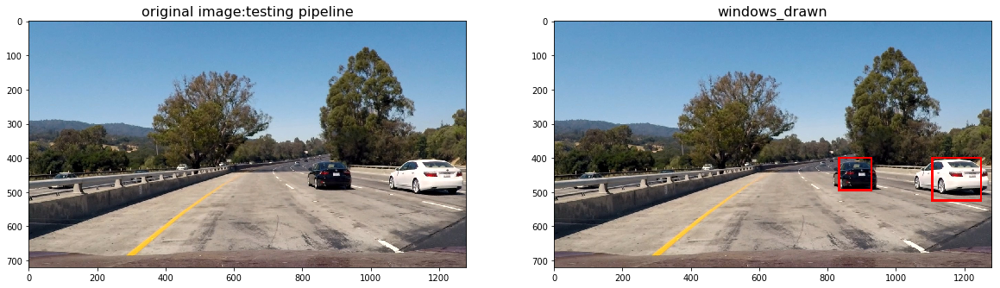

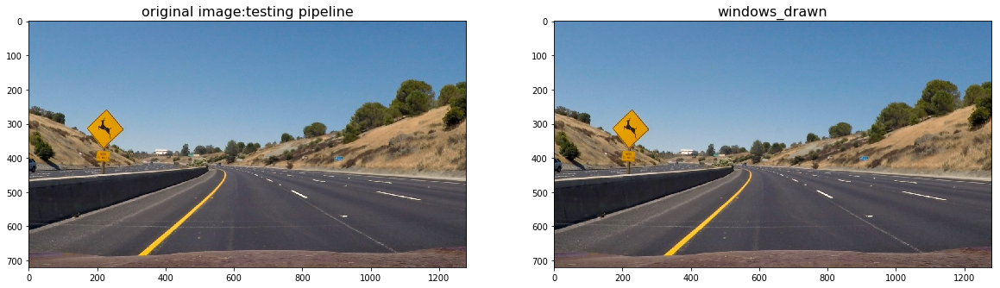

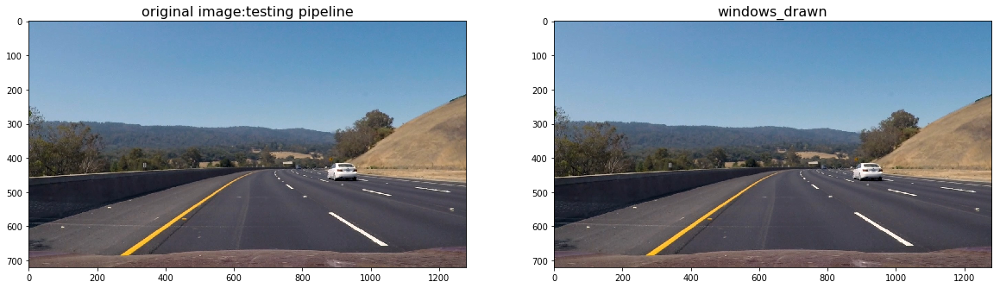

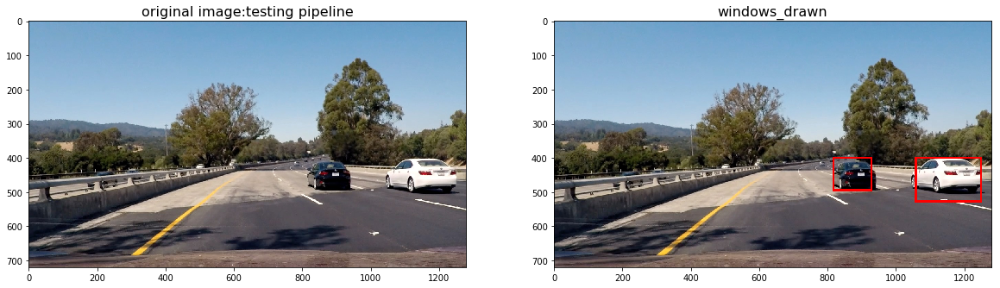

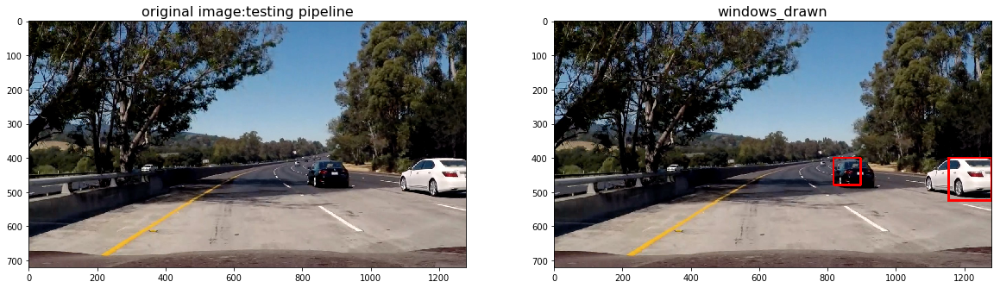

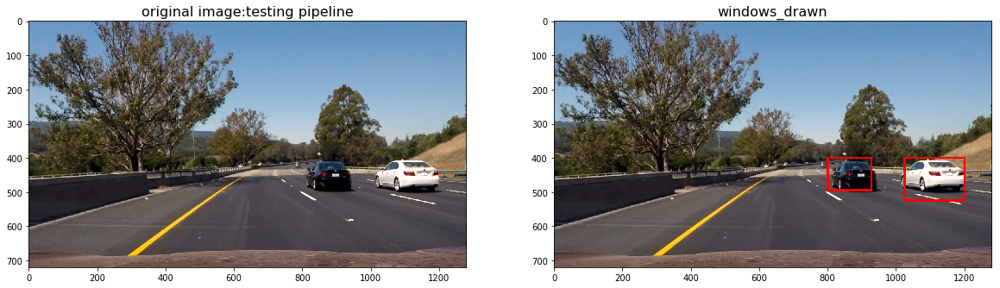

In [622]:
for img in test_imgs:
        img = mpimg.imread(img)
        result = pipeline_img(img)
        plot_windows(img,result,'testing pipeline')

Lets try this on the video.

In [623]:
# Import everything needed to edit/save/watch video clips
import os
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'output_test_video.mp4'
clip_out = VideoFileClip('test_video.mp4')
clip_in = clip_out.fl_image(pipeline_img)
%time clip_in.write_videofile(output, audio=False)
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

[MoviePy] >>>> Building video output_test_video.mp4
[MoviePy] Writing video output_test_video.mp4


 97%|█████████▋| 38/39 [00:13<00:00,  2.94it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_test_video.mp4 

CPU times: user 12 s, sys: 1.3 s, total: 13.3 s
Wall time: 13.7 s


The test video output looks good. Lets try on project video.

In [624]:
output = 'output_project_video.mp4'
clip_out = VideoFileClip('project_video.mp4').subclip(0,10)
clip_in = clip_out.fl_image(pipeline_img)
%time clip_in.write_videofile(output, audio=False)
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


  5%|▍         | 12/251 [00:04<01:27,  2.72it/s]

KeyboardInterrupt: 

The video is able to track vehicles in its lane near the camera without any negatives. No false positive detected.
The performance by the pipeline is satisfactory.